In [1]:
CONTENT_DIR    =  "/content"
TOOL_CLS       =  "RNGN12"
STAGE_TWO_DIR  = f"{CONTENT_DIR}/drive/MyDrive/2022-DC03/stage2"
MODEL_DIR      = f"{STAGE_TWO_DIR}/logs"
MLA_TEST_REPO  =  "https://github.com/claudiotancredi/Machine-learning-in-applications"
MLA_TEST_DIR   = f"{CONTENT_DIR}/mlinapptests"
SRC_DIR        = f"{MLA_TEST_DIR}/src/models/Stage2_ResNet50"
TBLOGS_DIR     = f"{STAGE_TWO_DIR}/tblogs"
BATCH_SIZE     = 4
IMG_HEIGHT     = 120
IMG_WIDTH      = 120
IMAGE_SIZE     = (IMG_HEIGHT, IMG_WIDTH)
NUM_EPOCHS_ONE = 100
NUM_EPOCHS_TWO = 200
OK             = 2
NOT_OK         = 1
DOUBT          = 0
LEARNING_RATE  = 1e-5
CROPS_DIR      = f"{CONTENT_DIR}/crops"
DC_DIR         = f"{STAGE_TWO_DIR}/2022-DC03"
TRAIN_DIR      = f"{DC_DIR}/dataset_{TOOL_CLS}_train"
TEST_DIR       = f"{DC_DIR}/dataset_{TOOL_CLS}_test"
TEST_JSON_PATH = f"{CROPS_DIR}/test.json"
IMAGES_DIR     = f"{CONTENT_DIR}/images"
DRIVE_ID       =  "13WLaD5Hxi-vL5YFyYr_6HCKqVbnT5ofN"

!nvidia-smi -L

GPU 0: Tesla T4 (UUID: GPU-c73c36c8-4d40-a8cc-6f88-c000852430ff)


In [2]:
## Compatibility Cell
import gdown
import os
import shutil
import glob

def extract_subfolder(file_name):
  if "wo" in file_name:
    return "OK"
  elif "wd" in file_name:
    return "DOUBT"
  elif "wn" in file_name:
    return "NOK"
  else:
    raise ValueError(f"{file_name} is not a valid path")

if not os.path.isdir(DC_DIR):
  os.makedirs(DC_DIR)

if not os.path.isdir(TRAIN_DIR):
  os.makedirs(TRAIN_DIR)

if not os.path.isdir(TEST_DIR):
  os.makedirs(TEST_DIR)

if not os.path.isdir(CROPS_DIR):
  os.makedirs(CROPS_DIR)

for cls in ["OK", "NOK", "DOUBT"]:
  path = os.path.join(TRAIN_DIR, cls)
  if not os.path.isdir(path):
    os.makedirs(path)
  path = os.path.join(TEST_DIR, cls)
  if not os.path.isdir(path):
    os.makedirs(path)

if not os.path.isdir(IMAGES_DIR):
  os.makedirs(IMAGES_DIR)

gdown.download_folder(id=DRIVE_ID, output=DC_DIR)

src = os.path.join(DC_DIR, f"{TOOL_CLS}_crops.zip")
dst = CROPS_DIR
shutil.unpack_archive(src, dst)

src = os.path.join(DC_DIR, f"images.zip")
dst = os.path.join(IMAGES_DIR, "all")

if not os.path.isdir(dst):
  os.makedirs(dst)

shutil.unpack_archive(src, dst)
images = [ file_path for file_path in glob.glob(f"{IMAGES_DIR}/**/*.bmp", recursive=True) if TOOL_CLS not in file_path ]
for image in images:
  if os.path.isfile(image):
    os.remove(image)

for split in ["train", "val", "test"]:
  dir = os.path.join(CROPS_DIR, split)
  file_list = glob.glob(f"{dir}/**/*.jpg", recursive=True)
  print(f"Copying {len(file_list)} files for {split} split")
  for src in file_list:
    if os.path.isfile(src):
      subfolder = extract_subfolder(src)
      base_name = os.path.basename(src)
      if split is not "test":
        dst = os.path.join(TRAIN_DIR, subfolder, base_name)
        shutil.copyfile(src, dst)
      else:
        dst = os.path.join(TEST_DIR, subfolder, base_name)
        shutil.copyfile(src, dst)

Retrieving folder list


Processing file 1jKQ0bMcqHAitHh6xB18qMBR6DkX7WdZh CNGA12_crops.zip
Processing file 1a38xTTyMoKaOBjSZRnOjBbKJTk_idolY images.zip
Processing file 11BsGheaJncpkr-PINze5pFylos6ab8sR RCGX12_crops.zip
Processing file 1tjfLz_STN4x0E3TYgZqvVEMFe8tzL-nV rcgx12-69-40.0.pth
Processing file 1IRgci610Fin_Shtdbppnp-xpAZyeHxy3 reqs.txt
Processing file 14xEy0lUER8S4VLu7meKsna-VRT1KvnDL RNGN12_crops.zip
Processing file 1a1KjXO--nWgRa5GD3pk2byI_hxMu9U4O RNGN19_crops.zip
Processing file 1W2MdqCYXfgdXg7qsBQN1WxKr36Gb79BG test.json
Processing file 1uq7BkUQoRwXjTsXOmFFkfvoECEVZorZb train.json
Processing file 1hQUE1mu1X3X8TFBS4FrxBVaOmom04Bs4 val.json
Processing file 1quLmjsU47rOxGlRqPSEbzk7gotpBRiDX yolact_epochs.patch
Processing file 1Y3ii1lVZHrJCMkPBdtmo-YI3wXmtMiCj yolact_lrsteps.patch
Processing file 1mXuLf3L6O4u-JSWGpTC8Uy7OagYjYf5w yolact-cnga12-89-20.88.pth
Processing file 1KQqZaMp30VkAhgQD0s9FMBriLiwhVVgK yolact-rngn12-205-41.01.pth
Processing file 17rQDA11kDpJwgz0FBhN7j8eZgXHnF-4_ yolact-rngn19-287

Retrieving folder list completed
Building directory structure
Downloading...
From: https://drive.google.com/uc?id=1jKQ0bMcqHAitHh6xB18qMBR6DkX7WdZh
To: /content/drive/MyDrive/2022-DC03/stage2/2022-DC03/CNGA12_crops.zip
100%|██████████| 284k/284k [00:00<00:00, 57.3MB/s]
Downloading...
From: https://drive.google.com/uc?id=1a38xTTyMoKaOBjSZRnOjBbKJTk_idolY
To: /content/drive/MyDrive/2022-DC03/stage2/2022-DC03/images.zip
100%|██████████| 1.04G/1.04G [00:05<00:00, 205MB/s]
Downloading...
From: https://drive.google.com/uc?id=11BsGheaJncpkr-PINze5pFylos6ab8sR
To: /content/drive/MyDrive/2022-DC03/stage2/2022-DC03/RCGX12_crops.zip
100%|██████████| 2.54M/2.54M [00:00<00:00, 138MB/s]
Downloading...
From: https://drive.google.com/uc?id=1tjfLz_STN4x0E3TYgZqvVEMFe8tzL-nV
To: /content/drive/MyDrive/2022-DC03/stage2/2022-DC03/rcgx12-69-40.0.pth
100%|██████████| 199M/199M [00:00<00:00, 227MB/s]
Downloading...
From: https://drive.google.com/uc?id=1IRgci610Fin_Shtdbppnp-xpAZyeHxy3
To: /content/drive/MyDr

Copying 365 files for train split
Copying 47 files for val split
Copying 107 files for test split


Cloning into '/content/mlinapptests'...
remote: Enumerating objects: 842, done.
remote: Counting objects: 100% (258/258), done.
remote: Compressing objects: 100% (134/134), done.
remote: Total 842 (delta 149), reused 212 (delta 124), pack-reused 584
Receiving objects: 100% (842/842), 187.41 MiB | 16.53 MiB/s, done.
Resolving deltas: 100% (402/402), done.
Checking out files: 100% (193/193), done.
/content/drive/MyDrive/2022-DC03/stage2/2022-DC03/dataset_RNGN12_train
Images for train and val: 412
Images for test         : 107


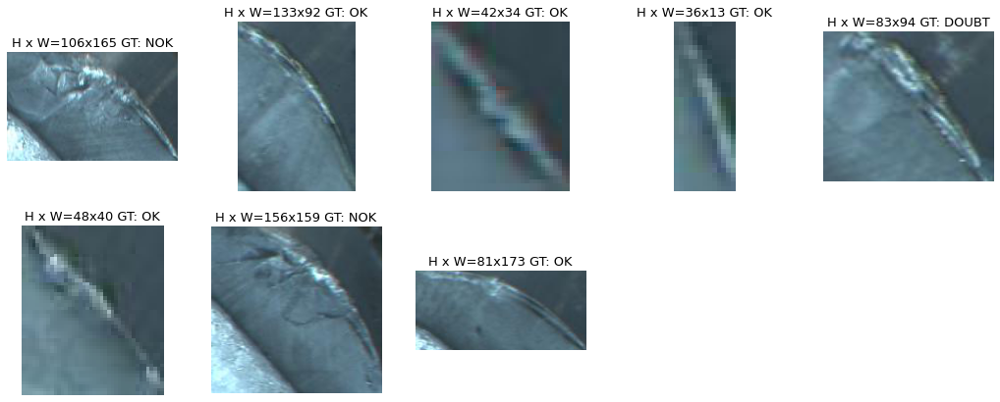

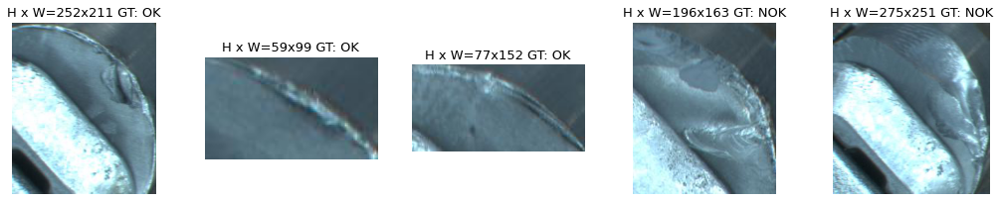

In [3]:
import os
import glob
import sys

if not os.path.isdir(MLA_TEST_DIR):
  !git clone $MLA_TEST_REPO $MLA_TEST_DIR

sys.path.append(SRC_DIR)
import utils

train_image_count = len(list(glob.glob(f"{TRAIN_DIR}/**/*.jpg", recursive=True)))
test_image_count  = len(list(glob.glob(f"{TEST_DIR }/**/*.jpg", recursive=True)))
print(TRAIN_DIR)
print(f"Images for train and val: {train_image_count}")
print(f"Images for test         : {test_image_count}")

utils.visualize_n_random_samples(TRAIN_DIR, 8) 
utils.visualize_n_random_samples(TEST_DIR, 5) 

In [4]:
import tensorflow as tf
import time

SEED = int(str(time.time())[-3:])

print(f"Seed: {SEED}")

train_ds = tf.keras.utils.image_dataset_from_directory(
  TRAIN_DIR,
  validation_split = 0.2,
  subset           = "training",
  seed             = SEED,
  image_size       = IMAGE_SIZE,
  batch_size       = BATCH_SIZE
)

val_ds = tf.keras.utils.image_dataset_from_directory(
  TRAIN_DIR,
  validation_split = 0.2,
  subset           = "validation",
  seed             = SEED,
  image_size       = IMAGE_SIZE,
  batch_size       = BATCH_SIZE
)

Seed: 718
Found 412 files belonging to 3 classes.
Using 330 files for training.
Found 412 files belonging to 3 classes.
Using 82 files for validation.


Class Names: ['DOUBT', 'NOK', 'OK']


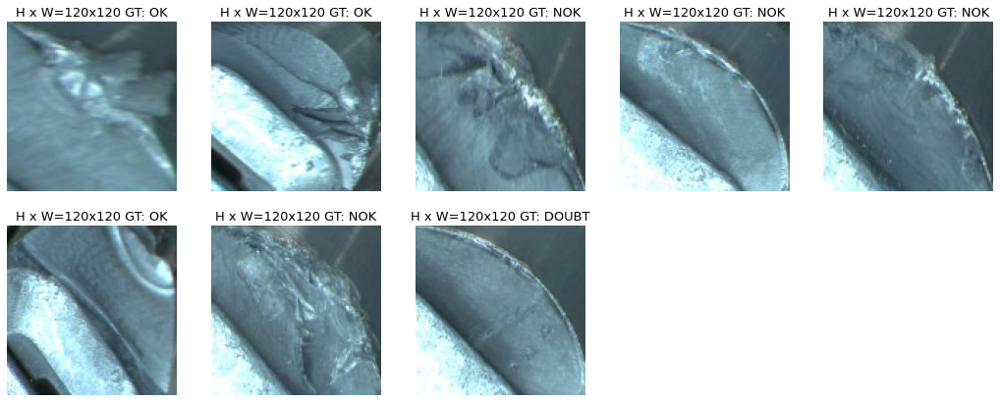

In [5]:
import utils

# balanced_train_ds = utils.rebalance_train_ds(train_ds)
balanced_train_ds = train_ds
class_names       = balanced_train_ds.class_names
print(f"Class Names: {class_names}")

images_arr = [ elem[0][0].numpy() for elem in balanced_train_ds.take(8) ]
labels_arr = [ f"GT: {class_names[elem[1][0].numpy()]}" for elem in balanced_train_ds.take(8) ]
utils.display(images_arr, labels_arr)

#Model

94781440/94765736 [==============================] - 0s 0us/step


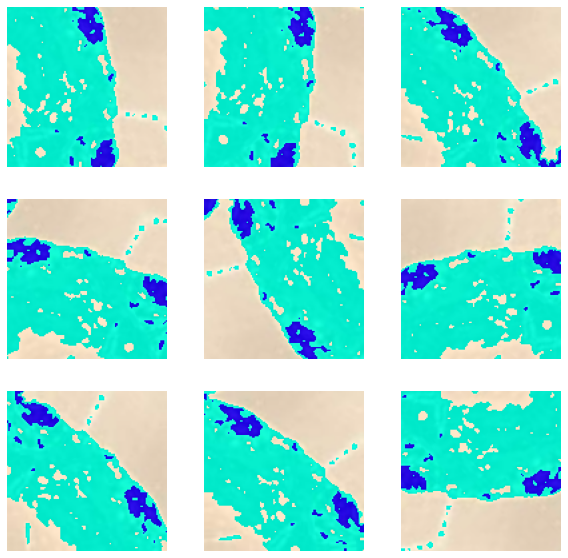

In [6]:
import datetime
import utils

now = datetime.datetime.now()
dir = f"tool_wear_{TOOL_CLS}_STAGE2_RESNET50_{now:%Y%m%dT%H%M}"
log_dir = os.path.join(MODEL_DIR, dir)
checkpoint_path = os.path.join(log_dir, "resnet50_tool_wear.h5")

# Callbacks
cp_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_path, verbose=1, save_weights_only=True, save_best_only=True)
es_callback = tf.keras.callbacks.EarlyStopping(patience=20, verbose=1, restore_best_weights=True)
tb_callback = tf.keras.callbacks.TensorBoard(log_dir, update_freq="epoch")

data_augmentation = tf.keras.Sequential(
    [tf.keras.layers.RandomFlip("horizontal_and_vertical"), tf.keras.layers.RandomRotation(0.25)]
)

base_model = tf.keras.applications.ResNet50(
    weights='imagenet',  # Load weights pre-trained on ImageNet.
    input_shape=(IMG_HEIGHT, IMG_WIDTH, 3),
    include_top=False)

utils.visualize_after_data_augm(balanced_train_ds, data_augmentation)

In [7]:
%load_ext tensorboard

In [8]:
import shutil
import os

if os.path.isdir(TBLOGS_DIR):
  shutil.rmtree(TBLOGS_DIR)
os.makedirs(TBLOGS_DIR)

In [9]:
from model import net 
import tensorflow as tf

base_model.trainable = False

model = net(base_model, data_augmentation, IMG_HEIGHT, IMG_WIDTH)
model.summary()
model.compile(optimizer = tf.keras.optimizers.Adam(),
              loss      = tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics   = [ tf.keras.metrics.SparseCategoricalAccuracy() ]
)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 120, 120, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 120, 120, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 120, 120, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 120, 120, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                      

In [10]:
if not os.path.exists(log_dir):
    os.makedirs(log_dir)
history = model.fit(
    balanced_train_ds, 
    epochs          = NUM_EPOCHS_ONE,
    validation_data = val_ds, 
    callbacks       = [ tb_callback, es_callback, cp_callback ]
)

Epoch 1/100
83/83 [==============================] - ETA: 0s - loss: 1.0910 - sparse_categorical_accuracy: 0.5970
Epoch 1: val_loss improved from inf to 0.76137, saving model to /content/drive/MyDrive/2022-DC03/stage2/logs/tool_wear_RNGN12_STAGE2_RESNET50_20220716T1336/resnet50_tool_wear.h5
83/83 [==============================] - 18s 41ms/step - loss: 1.0910 - sparse_categorical_accuracy: 0.5970 - val_loss: 0.7614 - val_sparse_categorical_accuracy: 0.7195
Epoch 2/100
80/83 [===========================>..] - ETA: 0s - loss: 0.7169 - sparse_categorical_accuracy: 0.7156
Epoch 2: val_loss improved from 0.76137 to 0.70227, saving model to /content/drive/MyDrive/2022-DC03/stage2/logs/tool_wear_RNGN12_STAGE2_RESNET50_20220716T1336/resnet50_tool_wear.h5
83/83 [==============================] - 2s 26ms/step - loss: 0.7172 - sparse_categorical_accuracy: 0.7152 - val_loss: 0.7023 - val_sparse_categorical_accuracy: 0.7073
Epoch 3/100
83/83 [==============================] - ETA: 0s - loss: 0.5873

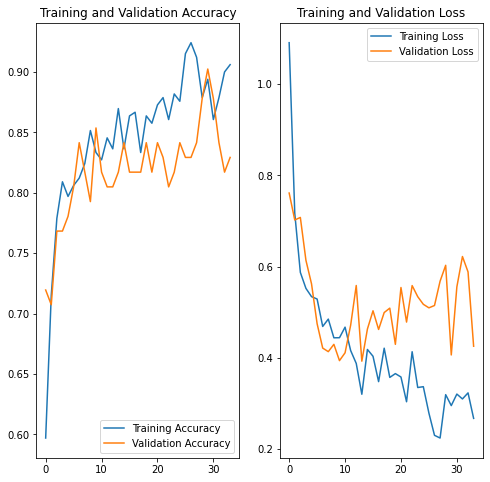

In [11]:
import utils
utils.plot_history(history)

In [12]:
# Unfreeze the base model
base_model.trainable = True
model.summary()
# It is important to recompile the model after setting it to trainable
model.compile(optimizer =   tf.keras.optimizers.Adam(LEARNING_RATE),  
              loss      =   tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics   = [ tf.keras.metrics.SparseCategoricalAccuracy() ] 
)

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 120, 120, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 120, 120, 3)       0         
                                                                 
 tf.__operators__.getitem (S  (None, 120, 120, 3)      0         
 licingOpLambda)                                                 
                                                                 
 tf.nn.bias_add (TFOpLambda)  (None, 120, 120, 3)      0         
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                      

In [13]:
if not os.path.exists(log_dir):
    os.makedirs(log_dir)

initial_epoch = len(history.history["sparse_categorical_accuracy"])

history2 = model.fit(
      balanced_train_ds, 
      initial_epoch   = initial_epoch,
      epochs          = NUM_EPOCHS_TWO, 
      validation_data = val_ds, 
      callbacks       = [ tb_callback, es_callback, cp_callback ]
)

Epoch 35/200
83/83 [==============================] - ETA: 0s - loss: 0.3961 - sparse_categorical_accuracy: 0.8545
Epoch 35: val_loss did not improve from 0.39272
83/83 [==============================] - 12s 64ms/step - loss: 0.3961 - sparse_categorical_accuracy: 0.8545 - val_loss: 0.4882 - val_sparse_categorical_accuracy: 0.7927
Epoch 36/200
83/83 [==============================] - ETA: 0s - loss: 0.3816 - sparse_categorical_accuracy: 0.8636
Epoch 36: val_loss did not improve from 0.39272
83/83 [==============================] - 4s 43ms/step - loss: 0.3816 - sparse_categorical_accuracy: 0.8636 - val_loss: 0.5064 - val_sparse_categorical_accuracy: 0.8049
Epoch 37/200
83/83 [==============================] - ETA: 0s - loss: 0.3414 - sparse_categorical_accuracy: 0.8697
Epoch 37: val_loss did not improve from 0.39272
83/83 [==============================] - 4s 44ms/step - loss: 0.3414 - sparse_categorical_accuracy: 0.8697 - val_loss: 0.4012 - val_sparse_categorical_accuracy: 0.8415
Epoch 

In [14]:
%tensorboard --logdir $log_dir

<IPython.core.display.Javascript object>

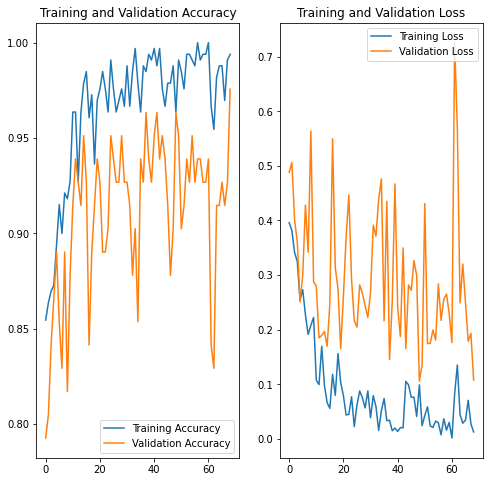

In [15]:
import utils
utils.plot_history(history2)

In [16]:
import utils

last = utils.find_last(MODEL_DIR, TOOL_CLS)
_ = model.load_weights(last)

print("Evaluating on validation data")
results = model.evaluate(val_ds)
print(f"Validation Loss, Validation Accuracy: {results}")

/content/drive/MyDrive/2022-DC03/stage2/logs/tool_wear_RNGN12_STAGE2_RESNET50_20220716T1336/resnet50_tool_wear.h5
Evaluating on validation data
21/21 [==============================] - 0s 19ms/step - loss: 0.1057 - sparse_categorical_accuracy: 0.9634
Validation Loss, Validation Accuracy: [0.10574403405189514, 0.9634146094322205]


In [17]:
test_ds = tf.keras.utils.image_dataset_from_directory(
  TEST_DIR,
  seed       = SEED,
  image_size = IMAGE_SIZE,
  batch_size = BATCH_SIZE,
  shuffle    = False
)

Found 107 files belonging to 3 classes.


In [18]:
import json

def filterf(val):
  return lambda image, label: label == val

dataset_ok    = test_ds.unbatch().filter(filterf(OK    )).batch(4)
dataset_nok   = test_ds.unbatch().filter(filterf(NOT_OK)).batch(4)
dataset_doubt = test_ds.unbatch().filter(filterf(DOUBT )).batch(4)

count_ok    = len(list(dataset_ok.unbatch().enumerate(start=0).as_numpy_iterator()))
count_nok   = len(list(dataset_nok.unbatch().enumerate(start=0).as_numpy_iterator()))
count_doubt = len(list(dataset_doubt.unbatch().enumerate(start=0).as_numpy_iterator()))

print(f"Images in test set : {count_nok + count_ok + count_doubt}")
print(f"Number of OK     Images: {count_ok}")
print(f"Number of NOT_OK Images: {count_nok}")
print(f"Number of DOUBT  Images: {count_doubt}")

count_images_stage1_ok  = 0
count_images_stage1_nok = 0
count_images_stage1_dbt = 0

with open(TEST_JSON_PATH, "r") as f:
  data = json.load(f)

tups = [ (elem["bbox"], elem["name"]) for elem in data if len(elem["bbox"]) == 0]

oks  = [ elem for elem in tups if "wo" in elem[1] ]
dbts = [ elem for elem in tups if "wd" in elem[1] ]
noks = [ elem for elem in tups if "wn" in elem[1] ]

count_images_stage1_ok = len(oks)
count_images_stage1_nok = len(noks)
count_images_stage1_dbt = len(dbts)
count_images_stage1_tot = count_images_stage1_ok + count_images_stage1_nok + count_images_stage1_dbt

total_ts = count_images_stage1_dbt+count_images_stage1_nok+count_images_stage1_ok+count_ok+count_nok+count_doubt

print("Number of NOK   images in test set already predicted by stage 1: ", count_images_stage1_nok)
print("Number of DOUBT images in test set already predicted by stage 1: ", count_images_stage1_dbt)
print("Number of OK    images in test set already predicted by stage 1: ", count_images_stage1_ok)
print("Number of TOTAL images in test set already predicted in stage 1: ", count_images_stage1_tot)

Images in test set : 107
Number of OK     Images: 40
Number of NOT_OK Images: 46
Number of DOUBT  Images: 21
Number of NOK   images in test set already predicted by stage 1:  1
Number of DOUBT images in test set already predicted by stage 1:  1
Number of OK    images in test set already predicted by stage 1:  7
Number of TOTAL images in test set already predicted in stage 1:  9


In [19]:
import utils
import json

print("Evaluating on test data")

with open(TEST_JSON_PATH, "r") as f:
  data = json.load(f)

cnt_ok, cnt_doubt, cnt_nok, cnt_crit, cnt_semicrit = utils.predict_stats(model, test_ds, data)

print(f"\nAccuracy:     {(cnt_ok+cnt_doubt+cnt_nok)/total_ts:.2%}")
print(f"")
print(f"OK    accuracy: {cnt_ok/(count_ok+count_images_stage1_ok):.2%}")
print(f"NOK   accuracy: {cnt_nok/(count_nok+count_images_stage1_nok):.2%}")
print(f"DOUBT accuracy: {cnt_doubt/(count_doubt+count_images_stage1_dbt):.2%}")

cnt_ok  = len([ path for path in test_ds.file_paths if "wo" in path ])
cnt_nok = len([ path for path in test_ds.file_paths if "wn" in path ])
cnt_dbt = len([ path for path in test_ds.file_paths if "wd" in path ])

print(f"OK    Samples in test set: {cnt_ok}")
print(f"NOK   Samples in test set: {cnt_nok}")
print(f"DOUBT Samples in test set: {cnt_dbt}")
print(f"")
print(f"Critical      wrong predictions (gt is wn, prediction is wo): {cnt_crit} ({(cnt_crit/cnt_nok):.2%})")
print(f"Semi-critical wrong predictions (gt is wn, prediction is wd): {cnt_semicrit} ({(cnt_semicrit/cnt_nok):.2%})")

Evaluating on test data
Ground truth was:  DOUBT  but prediction is:  OK
Ground truth was:  DOUBT  but prediction is:  OK
Ground truth was:  DOUBT  but prediction is:  OK
Ground truth was:  DOUBT  but prediction is:  OK
Ground truth was:  DOUBT  but prediction is:  NOK
Ground truth was:  DOUBT  but prediction is:  NOK
Ground truth was:  NOK  but prediction is:  OK
Ground truth was:  NOK  but prediction is:  OK
Ground truth was:  NOK  but prediction is:  DOUBT
Ground truth was:  NOK  but prediction is:  OK
Ground truth was:  DOUBT  but prediction is: OK
Ground truth was:  NOK  but prediction is: OK

Accuracy:     89.66%

OK    accuracy: 100.00%
NOK   accuracy: 89.36%
DOUBT accuracy: 68.18%
OK    Samples in test set: 40
NOK   Samples in test set: 46
DOUBT Samples in test set: 21

Critical      wrong predictions (gt is wn, prediction is wo): 4 (8.70%)
Semi-critical wrong predictions (gt is wn, prediction is wd): 1 (2.17%)


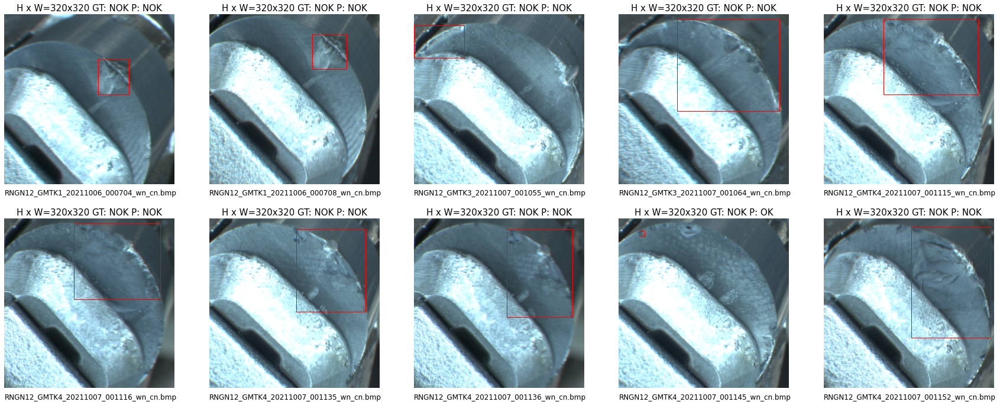

In [20]:
import utils
import json

with open(TEST_JSON_PATH, "r") as f:
  data = json.load(f)

def filterf(val):
  return lambda image, label: label == val

test_ds_ok    = test_ds.unbatch().filter(filterf(OK     )).batch(4)
test_ds_nok   = test_ds.unbatch().filter(filterf(NOT_OK )).batch(4)
test_ds_doubt = test_ds.unbatch().filter(filterf(DOUBT  )).batch(4)

ok_paths  = [ path for path in test_ds.file_paths if "wo" in path ]
nok_paths = [ path for path in test_ds.file_paths if "wn" in path ]
dbt_paths = [ path for path in test_ds.file_paths if "wd" in path ]

factr = 320 / 299

# Get and visualize NOK test predictions
dir = os.path.join(IMAGES_DIR, "all/")
imgs, preds, bboxes, names = utils.get_prediction_info(model, test_ds_nok, test_ds, nok_paths, dir, data, n=10)

bboxes = [ [ int(value * factr) for value in bbox ] for bbox in bboxes ]
  
utils.display_bbox(imgs, preds, bboxes, names)

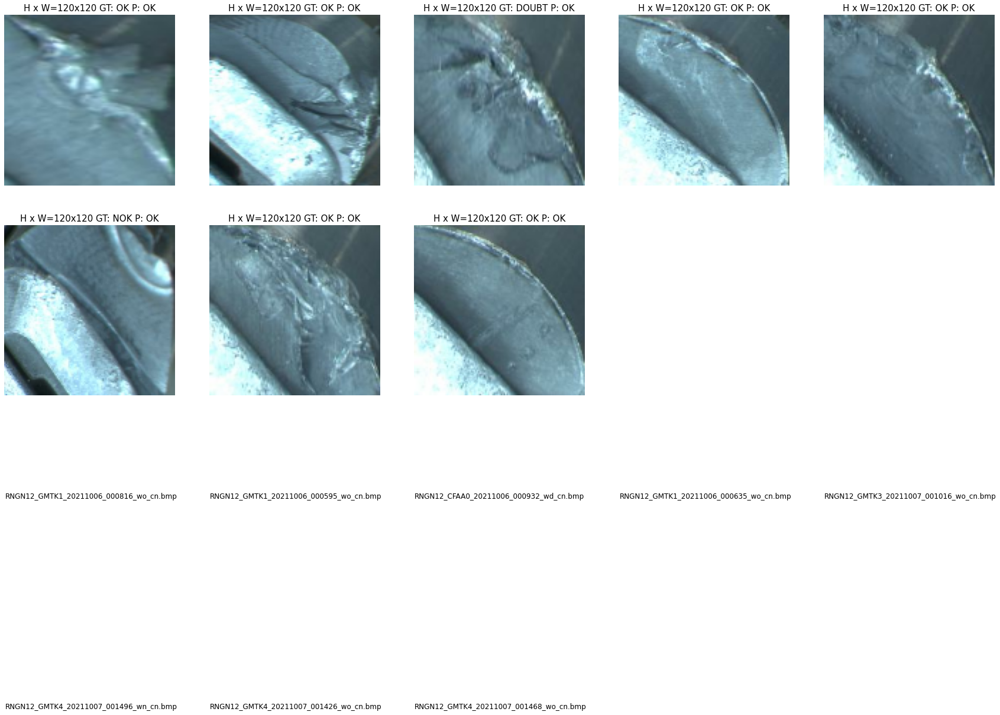

In [21]:
#Visualize predictions of stage 1 if any
import json
import utils

with open(TEST_JSON_PATH, "r") as f:
  data = json.load(f)

dir = os.path.join(IMAGES_DIR, "all/")
imgs, preds, names = utils.get_prediction_s1_info(dir, data)
utils.display_bbox(images_arr, preds, None, names)